In [103]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns
from warnings import filterwarnings
filterwarnings('ignore')

pd.options.display.max_columns = None
pd.options.display.max_rows = None   
pd.options.display.float_format = '{:.6f}'.format

import statsmodels
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler 
from sklearn.preprocessing import LabelEncoder

from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import accuracy_score

from sklearn.feature_selection import RFE

from sklearn.neighbors import KNeighborsClassifier

from sklearn.naive_bayes import GaussianNB

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import StackingClassifier

from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, ConfusionMatrixDisplay,
precision_score,  recall_score, f1_score, classification_report, roc_curve,  auc, precision_recall_curve,  
average_precision_score

In [104]:
#1
df = pd.read_csv("mushrooms.csv")

In [105]:
df.head()

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,stalk-root,stalk-surface-above-ring,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,p,x,s,n,t,p,f,c,n,k,e,e,s,s,w,w,p,w,o,p,k,s,u
1,e,x,s,y,t,a,f,c,b,k,e,c,s,s,w,w,p,w,o,p,n,n,g
2,e,b,s,w,t,l,f,c,b,n,e,c,s,s,w,w,p,w,o,p,n,n,m
3,p,x,y,w,t,p,f,c,n,n,e,e,s,s,w,w,p,w,o,p,k,s,u
4,e,x,s,g,f,n,f,w,b,k,t,e,s,s,w,w,p,w,o,e,n,a,g


In [106]:
df.dtypes

class                       object
cap-shape                   object
cap-surface                 object
cap-color                   object
bruises                     object
odor                        object
gill-attachment             object
gill-spacing                object
gill-size                   object
gill-color                  object
stalk-shape                 object
stalk-root                  object
stalk-surface-above-ring    object
stalk-surface-below-ring    object
stalk-color-above-ring      object
stalk-color-below-ring      object
veil-type                   object
veil-color                  object
ring-number                 object
ring-type                   object
spore-print-color           object
population                  object
habitat                     object
dtype: object

In [107]:
#2A
num_rows = len(df)
print("Number of rows:" , num_rows)

var_types = df.dtypes.value_counts()
print("Number and type of variable: ", var_types)

Number of rows: 8124
Number and type of variable:  object    23
dtype: int64


In [108]:
#2B

df.describe()

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,stalk-root,stalk-surface-above-ring,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
count,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124
unique,2,6,4,10,2,9,2,2,2,12,2,5,4,4,9,9,1,4,3,5,9,6,7
top,e,x,y,n,f,n,f,c,b,b,t,b,s,s,w,w,p,w,o,p,w,v,d
freq,4208,3656,3244,2284,4748,3528,7914,6812,5612,1728,4608,3776,5176,4936,4464,4384,8124,7924,7488,3968,2388,4040,3148


In [109]:
#2C
categorical_columns = df.select_dtypes(include=['object']).columns

summary = []

for column in categorical_columns:
    categories = df[column].value_counts()
    category_percentages = df[column].value_counts(normalize=True) * 100
    summary.append((column, len(categories), category_percentages))

print("Categorical Variable Summary:")
for column, num_categories, category_percentages in summary:
    print(f"\n{column}:")
    print(f"Number of categories: {num_categories}")
    print("Percentage of observations in each category:")
    print(category_percentages)

Categorical Variable Summary:

class:
Number of categories: 2
Percentage of observations in each category:
e   51.797144
p   48.202856
Name: class, dtype: float64

cap-shape:
Number of categories: 6
Percentage of observations in each category:
x   45.002462
f   38.798621
k   10.192024
b    5.563762
s    0.393895
c    0.049237
Name: cap-shape, dtype: float64

cap-surface:
Number of categories: 4
Percentage of observations in each category:
y   39.931068
s   31.462334
f   28.557361
g    0.049237
Name: cap-surface, dtype: float64

cap-color:
Number of categories: 10
Percentage of observations in each category:
n   28.114229
g   22.648941
e   18.463811
y   13.195470
w   12.801576
b    2.067947
p    1.772526
c    0.541605
u    0.196947
r    0.196947
Name: cap-color, dtype: float64

bruises:
Number of categories: 2
Percentage of observations in each category:
f   58.444116
t   41.555884
Name: bruises, dtype: float64

odor:
Number of categories: 9
Percentage of observations in each category:


In [110]:
#3A

df.isna().sum()

class                       0
cap-shape                   0
cap-surface                 0
cap-color                   0
bruises                     0
odor                        0
gill-attachment             0
gill-spacing                0
gill-size                   0
gill-color                  0
stalk-shape                 0
stalk-root                  0
stalk-surface-above-ring    0
stalk-surface-below-ring    0
stalk-color-above-ring      0
stalk-color-below-ring      0
veil-type                   0
veil-color                  0
ring-number                 0
ring-type                   0
spore-print-color           0
population                  0
habitat                     0
dtype: int64

In [111]:
categorical_columns = df.select_dtypes(include=['object']).columns

# Perform label encoding for each categorical variable
label_encoder = LabelEncoder()

for column in categorical_columns:
    df[column] = label_encoder.fit_transform(df[column])


df


,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,stalk-root,stalk-surface-above-ring,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,1,5,2,4,1,6,1,0,1,4,0,3,2,2,7,7,0,2,1,4,2,3,5
1,0,5,2,9,1,0,1,0,0,4,0,2,2,2,7,7,0,2,1,4,3,2,1
2,0,0,2,8,1,3,1,0,0,5,0,2,2,2,7,7,0,2,1,4,3,2,3
3,1,5,3,8,1,6,1,0,1,5,0,3,2,2,7,7,0,2,1,4,2,3,5
4,0,5,2,3,0,5,1,1,0,4,1,3,2,2,7,7,0,2,1,0,3,0,1
5,0,5,3,9,1,0,1,0,0,5,0,2,2,2,7,7,0,2,1,4,2,2,1
6,0,0,2,8,1,0,1,0,0,2,0,2,2,2,7,7,0,2,1,4,2,2,3
7,0,0,3,8,1,3,1,0,0,5,0,2,2,2,7,7,0,2,1,4,3,3,3
8,1,5,3,8,1,6,1,0,1,7,0,3,2,2,7,7,0,2,1,4,2,4,1
9,0,0,2,9,1,0,1,0,0,2,0,2,2,2,7,7,0,2,1,4,2,3,3


In [112]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8124 entries, 0 to 8123
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   class                     8124 non-null   int32
 1   cap-shape                 8124 non-null   int32
 2   cap-surface               8124 non-null   int32
 3   cap-color                 8124 non-null   int32
 4   bruises                   8124 non-null   int32
 5   odor                      8124 non-null   int32
 6   gill-attachment           8124 non-null   int32
 7   gill-spacing              8124 non-null   int32
 8   gill-size                 8124 non-null   int32
 9   gill-color                8124 non-null   int32
 10  stalk-shape               8124 non-null   int32
 11  stalk-root                8124 non-null   int32
 12  stalk-surface-above-ring  8124 non-null   int32
 13  stalk-surface-below-ring  8124 non-null   int32
 14  stalk-color-above-ring    8124 non-null 

In [113]:
df1 = df.columns
df1

Index(['class', 'cap-shape', 'cap-surface', 'cap-color', 'bruises', 'odor',
       'gill-attachment', 'gill-spacing', 'gill-size', 'gill-color',
       'stalk-shape', 'stalk-root', 'stalk-surface-above-ring',
       'stalk-surface-below-ring', 'stalk-color-above-ring',
       'stalk-color-below-ring', 'veil-type', 'veil-color', 'ring-number',
       'ring-type', 'spore-print-color', 'population', 'habitat'],
      dtype='object')

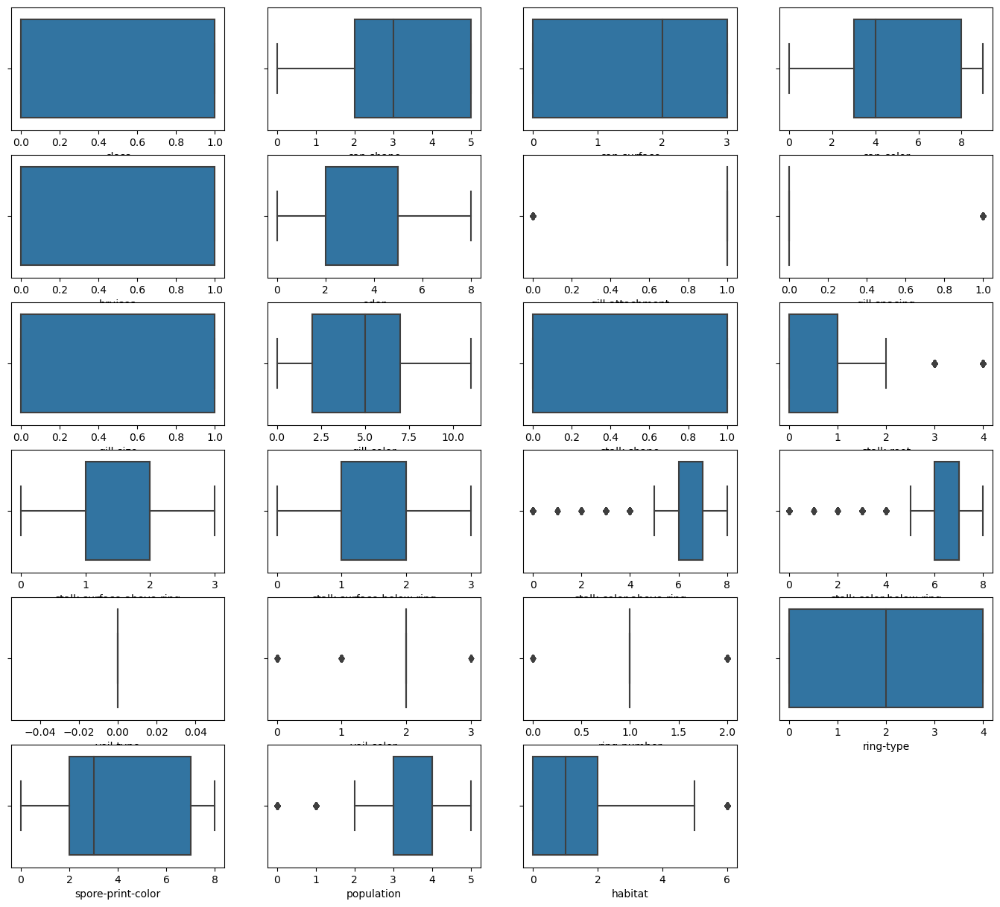

In [114]:
t=1
plt.figure(figsize = (17,15))
for i in df1:
    plt.subplot(6,4,t)
    sns.boxplot(df[i])
    t+=1
plt.show()

In [115]:
for i in df1:
    q1,q3 = np.quantile(df[i],[0.25,0.75])
    iqr = q3 - q1
    ub = q3 + (1.5 * iqr)
    lb = q1 - (1.5 * iqr)
    df[i] = np.where(df[i] > ub, ub, df[i])
    df[i] = np.where(df[i] < lb, lb, df[i])

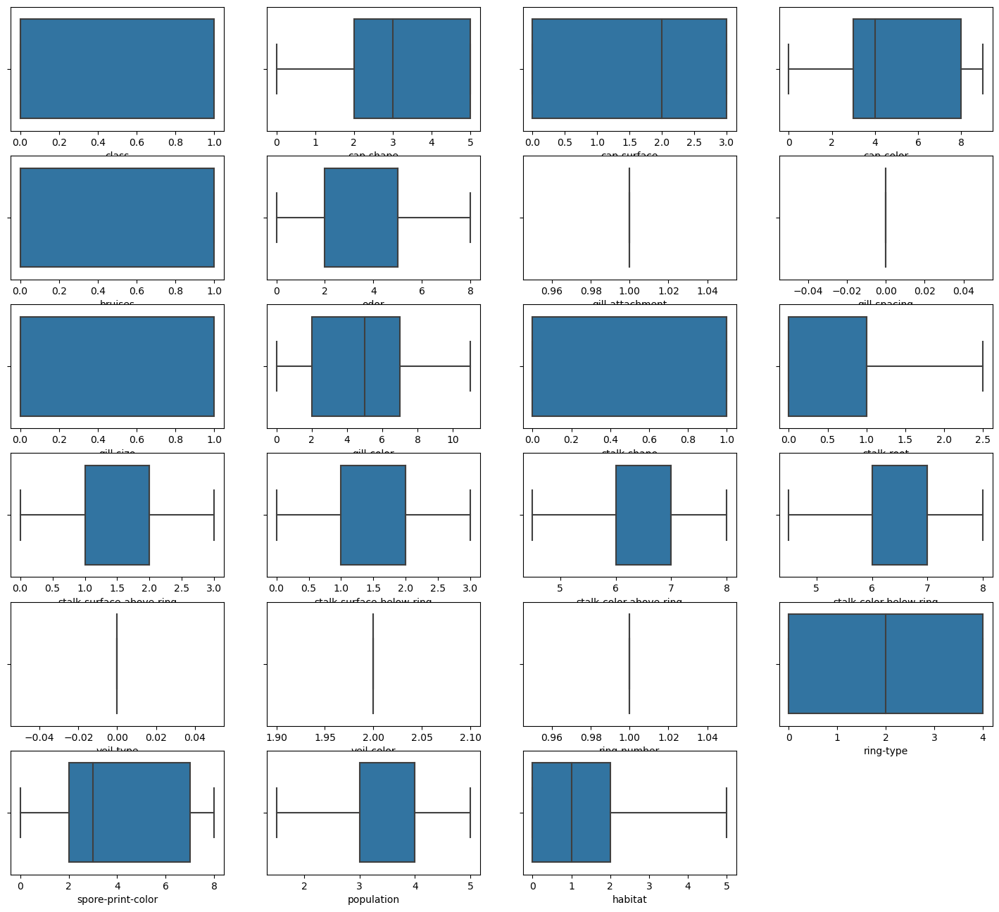

In [116]:
t=1
plt.figure(figsize = (18,16))
for i in df1:
    plt.subplot(6,4,t)
    sns.boxplot(df[i])
    t+=1
plt.show()

<AxesSubplot:xlabel='class', ylabel='count'>

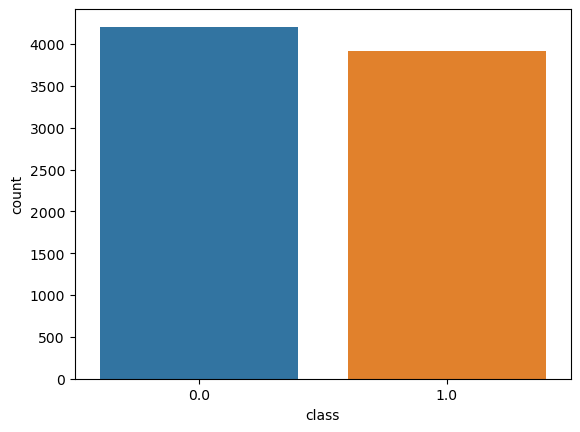

In [118]:
sns.countplot(df['class'])

In [119]:
df.corr()

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,stalk-root,stalk-surface-above-ring,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
class,1.000000,0.052951,0.178446,-0.031384,-0.501530,-0.093552,NaN,NaN,0.540024,-0.530566,-0.102019,-0.388292,-0.334593,-0.298801,-0.135827,-0.122912,NaN,NaN,NaN,-0.411771,0.171961,0.284947,0.238180
cap-shape,0.052951,1.000000,-0.050454,-0.048203,-0.035374,-0.021935,NaN,NaN,0.054050,-0.006039,0.063794,0.025086,-0.030417,-0.032591,-0.026404,-0.024374,NaN,NaN,NaN,-0.025457,-0.073416,0.079807,-0.043509
cap-surface,0.178446,-0.050454,1.000000,-0.019402,0.070228,0.045233,NaN,NaN,0.208100,-0.161017,-0.014123,-0.158140,0.089090,0.107965,0.059037,0.063078,NaN,NaN,NaN,-0.106407,0.230364,-0.010539,0.161629
cap-color,-0.031384,-0.048203,-0.019402,1.000000,-0.000764,-0.387121,NaN,NaN,-0.169464,0.084659,-0.456496,0.345921,-0.060837,-0.047710,0.065283,0.073875,NaN,NaN,NaN,0.162513,-0.293523,-0.172971,0.044855
bruises,-0.501530,-0.035374,0.070228,-0.000764,1.000000,-0.061825,NaN,NaN,-0.369596,0.527120,0.099364,0.283288,0.460824,0.458983,0.083521,0.097564,NaN,NaN,NaN,0.692973,-0.285008,0.056539,-0.094463
odor,-0.093552,-0.021935,0.045233,-0.387121,-0.061825,1.000000,NaN,NaN,0.310495,-0.129213,0.459766,-0.243078,0.118617,0.061820,0.117665,0.108979,NaN,NaN,NaN,-0.281387,0.469055,-0.017907,-0.033279
gill-attachment,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gill-spacing,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gill-size,0.540024,0.054050,0.208100,-0.169464,-0.369596,0.310495,NaN,NaN,1.000000,-0.516736,0.214576,-0.398834,0.056310,0.010894,0.289672,0.259473,NaN,NaN,NaN,-0.460872,0.622991,0.122654,0.176345
gill-color,-0.530566,-0.006039,-0.161017,0.084659,0.527120,-0.129213,NaN,NaN,-0.516736,1.000000,-0.175699,0.352774,0.224287,0.257224,-0.052336,-0.077873,NaN,NaN,NaN,0.629398,-0.416135,-0.031555,-0.212559


<AxesSubplot:>

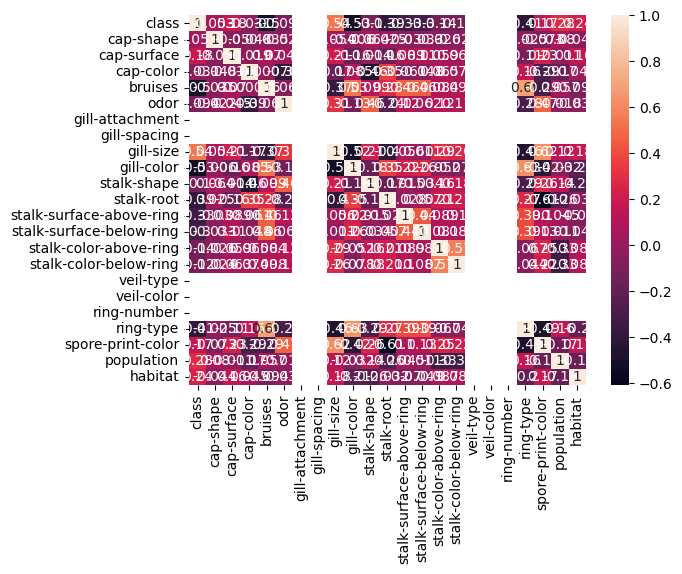

In [120]:
sns.heatmap(df.corr() , annot = True)

In [121]:
dfc = df.copy()

In [122]:
dfc = dfc.drop(['gill-attachment','gill-spacing','veil-type','veil-color','ring-number'] , axis = 1)

In [123]:
dfc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8124 entries, 0 to 8123
Data columns (total 18 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   class                     8124 non-null   float64
 1   cap-shape                 8124 non-null   float64
 2   cap-surface               8124 non-null   float64
 3   cap-color                 8124 non-null   float64
 4   bruises                   8124 non-null   float64
 5   odor                      8124 non-null   float64
 6   gill-size                 8124 non-null   float64
 7   gill-color                8124 non-null   float64
 8   stalk-shape               8124 non-null   float64
 9   stalk-root                8124 non-null   float64
 10  stalk-surface-above-ring  8124 non-null   float64
 11  stalk-surface-below-ring  8124 non-null   float64
 12  stalk-color-above-ring    8124 non-null   float64
 13  stalk-color-below-ring    8124 non-null   float64
 14  ring-typ

<AxesSubplot:>

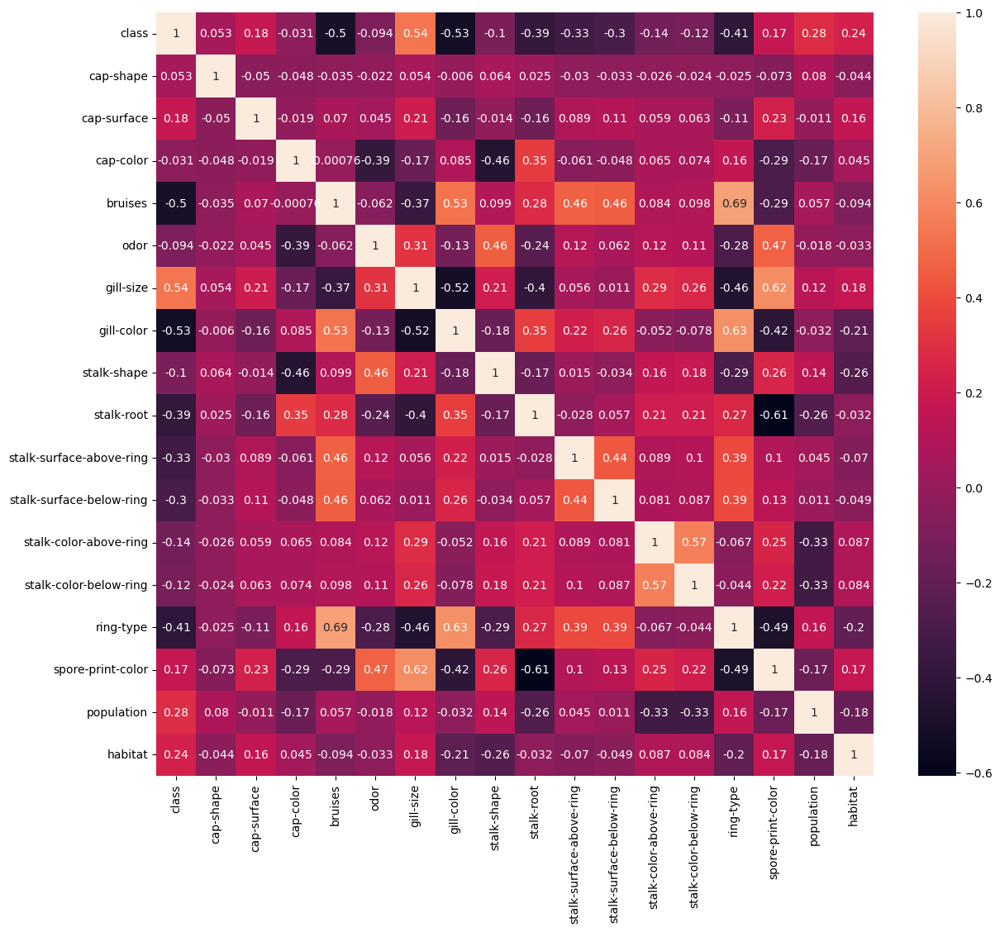

In [198]:
plt.figure(figsize = (14,12))
sns.heatmap(dfc.corr() , annot = True)

In [199]:
dfc.corr()

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-size,gill-color,stalk-shape,stalk-root,stalk-surface-above-ring,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,ring-type,spore-print-color,population,habitat
class,1.000000,0.052951,0.178446,-0.031384,-0.501530,-0.093552,0.540024,-0.530566,-0.102019,-0.388292,-0.334593,-0.298801,-0.135827,-0.122912,-0.411771,0.171961,0.284947,0.238180
cap-shape,0.052951,1.000000,-0.050454,-0.048203,-0.035374,-0.021935,0.054050,-0.006039,0.063794,0.025086,-0.030417,-0.032591,-0.026404,-0.024374,-0.025457,-0.073416,0.079807,-0.043509
cap-surface,0.178446,-0.050454,1.000000,-0.019402,0.070228,0.045233,0.208100,-0.161017,-0.014123,-0.158140,0.089090,0.107965,0.059037,0.063078,-0.106407,0.230364,-0.010539,0.161629
cap-color,-0.031384,-0.048203,-0.019402,1.000000,-0.000764,-0.387121,-0.169464,0.084659,-0.456496,0.345921,-0.060837,-0.047710,0.065283,0.073875,0.162513,-0.293523,-0.172971,0.044855
bruises,-0.501530,-0.035374,0.070228,-0.000764,1.000000,-0.061825,-0.369596,0.527120,0.099364,0.283288,0.460824,0.458983,0.083521,0.097564,0.692973,-0.285008,0.056539,-0.094463
odor,-0.093552,-0.021935,0.045233,-0.387121,-0.061825,1.000000,0.310495,-0.129213,0.459766,-0.243078,0.118617,0.061820,0.117665,0.108979,-0.281387,0.469055,-0.017907,-0.033279
gill-size,0.540024,0.054050,0.208100,-0.169464,-0.369596,0.310495,1.000000,-0.516736,0.214576,-0.398834,0.056310,0.010894,0.289672,0.259473,-0.460872,0.622991,0.122654,0.176345
gill-color,-0.530566,-0.006039,-0.161017,0.084659,0.527120,-0.129213,-0.516736,1.000000,-0.175699,0.352774,0.224287,0.257224,-0.052336,-0.077873,0.629398,-0.416135,-0.031555,-0.212559
stalk-shape,-0.102019,0.063794,-0.014123,-0.456496,0.099364,0.459766,0.214576,-0.175699,1.000000,-0.173906,0.015193,-0.034399,0.163874,0.182327,-0.291444,0.258831,0.143931,-0.262003
stalk-root,-0.388292,0.025086,-0.158140,0.345921,0.283288,-0.243078,-0.398834,0.352774,-0.173906,1.000000,-0.027988,0.057153,0.210475,0.211502,0.266703,-0.607706,-0.262454,-0.031825


In [200]:
dfc.skew()

class                       0.071946
cap-shape                  -0.247052
cap-surface                -0.590859
cap-color                   0.706965
bruises                     0.342750
odor                       -0.080790
gill-size                   0.825797
gill-color                  0.061410
stalk-shape                -0.271345
stalk-root                  0.468265
stalk-surface-above-ring   -1.098739
stalk-surface-below-ring   -0.757703
stalk-color-above-ring     -0.865085
stalk-color-below-ring     -0.815881
ring-type                  -0.290018
spore-print-color           0.548426
population                 -0.819709
habitat                     0.884403
dtype: float64

In [201]:
X = dfc.drop(['class'],axis=1)
y = dfc['class']

In [ ]:
X = sm.add_constant(X)

In [202]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=10)

<AxesSubplot:xlabel='class', ylabel='count'>

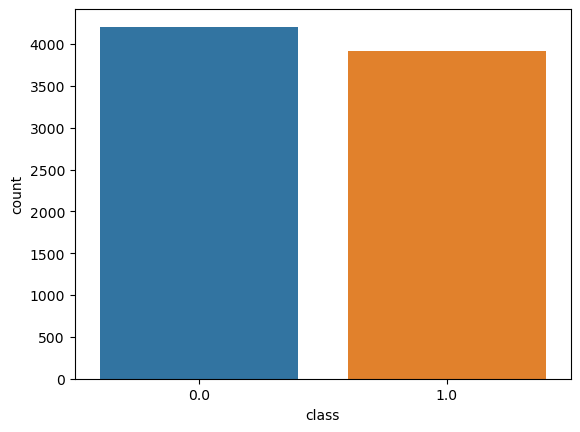

In [203]:
sns.countplot(dfc['class'])

In [204]:
def get_test_report(model, test_data):
    test_pred = model.predict(test_data)
    return(classification_report(y_test, test_pred))

In [205]:
def get_train_report(model, train_data):
    train_pred = model.predict(train_data)
    return(classification_report(y_train, train_pred))

In [206]:
def plot_confusion_matrix(model, test_data):
    y_pred = model.predict(test_data)
    cm = confusion_matrix(y_test, y_pred)
    conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
    sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
                linewidths = 0.1, annot_kws = {'size':25})
    plt.xticks(fontsize = 20)
    plt.yticks(fontsize = 20)
    plt.show()

In [207]:
def plot_roc(model, test_data):
    y_pred_prob = model.predict_proba(test_data)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    plt.plot(fpr, tpr)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.plot([0, 1], [0, 1],'r--')
    plt.title('ROC curve for Cancer Prediction Classifier', fontsize = 15)
    plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
    plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)
    plt.text(x = 0.02, y = 0.9, s = ('AUC Score:',round(roc_auc_score(y_test, y_pred_prob),4)))
    plt.grid(True)

# Logistic Reg

In [208]:
Base_model=LogisticRegression()
Base_model.fit(X_train,y_train)


LogisticRegression()

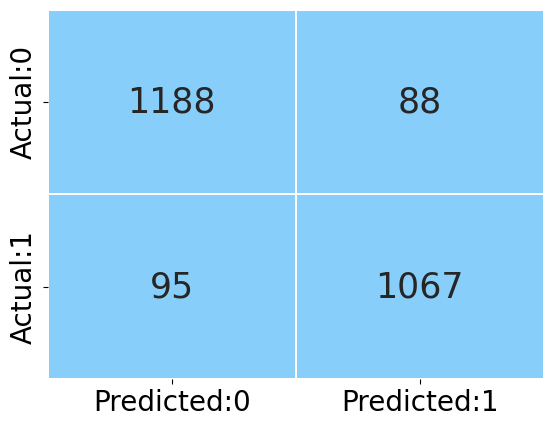

In [209]:
plot_confusion_matrix(Base_model, test_data = X_test)

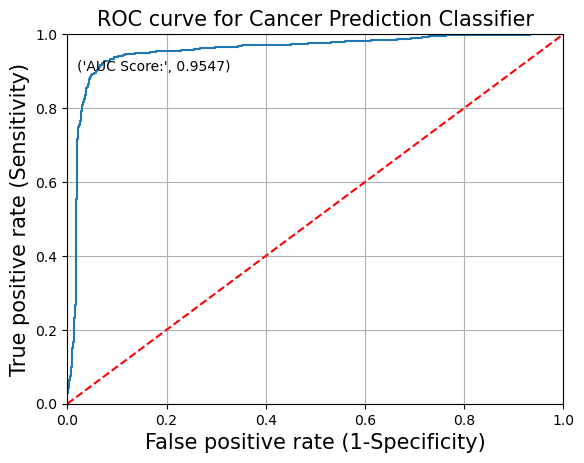

In [210]:
plot_roc(Base_model, test_data = X_test)

In [211]:
test_report = get_test_report(Base_model, test_data = X_test)
print(test_report)

              precision    recall  f1-score   support

         0.0       0.93      0.93      0.93      1276
         1.0       0.92      0.92      0.92      1162

    accuracy                           0.92      2438
   macro avg       0.92      0.92      0.92      2438
weighted avg       0.92      0.92      0.92      2438



In [212]:
print('Classification Report for train set: \n', get_train_report(Base_model, train_data = X_train))

Classification Report for train set: 
               precision    recall  f1-score   support

         0.0       0.93      0.93      0.93      2932
         1.0       0.93      0.92      0.93      2754

    accuracy                           0.93      5686
   macro avg       0.93      0.93      0.93      5686
weighted avg       0.93      0.93      0.93      5686



In [213]:
print('Classification Report for test set: \n', get_test_report(Base_model, test_data = X_test))

Classification Report for test set: 
               precision    recall  f1-score   support

         0.0       0.93      0.93      0.93      1276
         1.0       0.92      0.92      0.92      1162

    accuracy                           0.92      2438
   macro avg       0.92      0.92      0.92      2438
weighted avg       0.92      0.92      0.92      2438



# KNN

In [214]:
knn_classification = KNeighborsClassifier(n_neighbors = 3)
knn_model = knn_classification.fit(X_train, y_train)

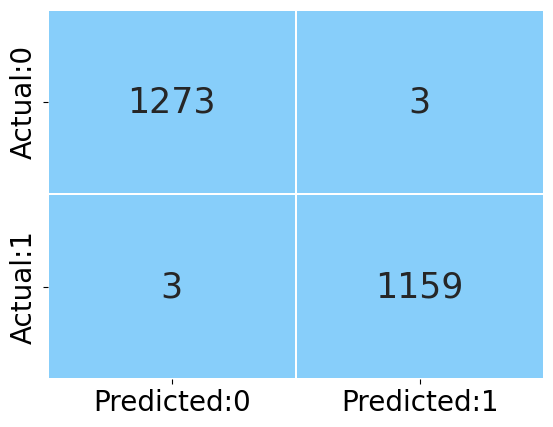

In [215]:
plot_confusion_matrix(knn_model, test_data = X_test)

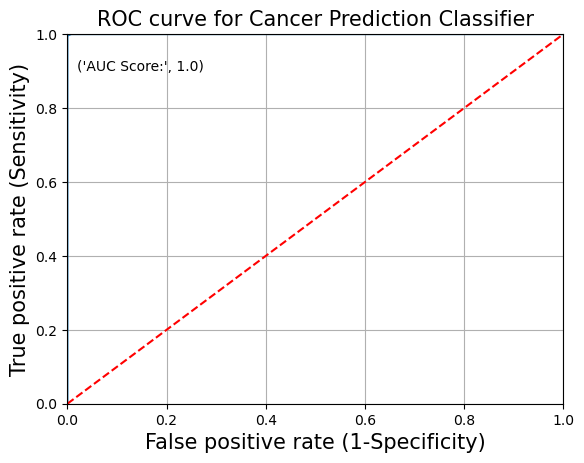

In [216]:
plot_roc(knn_model, test_data = X_test)

### KNN Classification GridSearchCV 

In [217]:
tuned_paramaters = {'n_neighbors': np.arange(1, 25, 2),
                   'metric': ['hamming','euclidean','manhattan','Chebyshev']}
 
# instantiate the 'KNeighborsClassifier' 
knn_classification = KNeighborsClassifier()
knn_grid = GridSearchCV(estimator = knn_classification, 
                        param_grid = tuned_paramaters, 
                        cv = 5, 
                        scoring = 'accuracy')
knn_grid.fit(X_train, y_train)
print('Best parameters for KNN Classifier: ', knn_grid.best_params_, '\n')

Best parameters for KNN Classifier:  {'metric': 'hamming', 'n_neighbors': 1} 



In [218]:
knn_classification = KNeighborsClassifier(n_neighbors = 1,metric= 'manhattan')
knn_model_hp = knn_classification.fit(X_train, y_train)

In [219]:
train_report = get_train_report(knn_model_hp, train_data = X_train)
print(train_report)

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2932
         1.0       1.00      1.00      1.00      2754

    accuracy                           1.00      5686
   macro avg       1.00      1.00      1.00      5686
weighted avg       1.00      1.00      1.00      5686



In [220]:
test_report = get_test_report(knn_model_hp, test_data = X_test)
print(test_report)

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1276
         1.0       1.00      1.00      1.00      1162

    accuracy                           1.00      2438
   macro avg       1.00      1.00      1.00      2438
weighted avg       1.00      1.00      1.00      2438



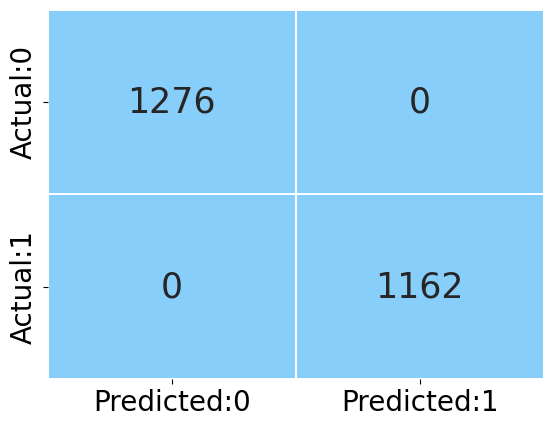

In [221]:
plot_confusion_matrix(knn_model_hp, test_data = X_test)

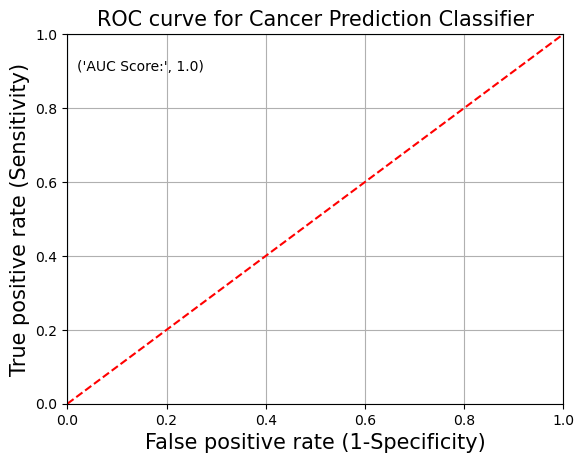

In [222]:
plot_roc(knn_model_hp, test_data = X_test)

### GaussianNB 

In [223]:
gnb = GaussianNB()
gnb_model = gnb.fit(X_train, y_train)

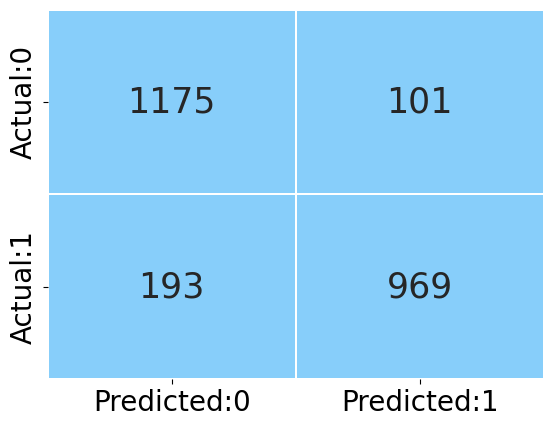

In [224]:
plot_confusion_matrix(gnb_model, test_data=X_test)

In [225]:
train_report = get_train_report(gnb_model, train_data=X_train)
print(train_report)

              precision    recall  f1-score   support

         0.0       0.87      0.93      0.89      2932
         1.0       0.91      0.85      0.88      2754

    accuracy                           0.89      5686
   macro avg       0.89      0.89      0.89      5686
weighted avg       0.89      0.89      0.89      5686



In [226]:
test_report = get_test_report(gnb_model, test_data=X_test)
print(test_report)

              precision    recall  f1-score   support

         0.0       0.86      0.92      0.89      1276
         1.0       0.91      0.83      0.87      1162

    accuracy                           0.88      2438
   macro avg       0.88      0.88      0.88      2438
weighted avg       0.88      0.88      0.88      2438



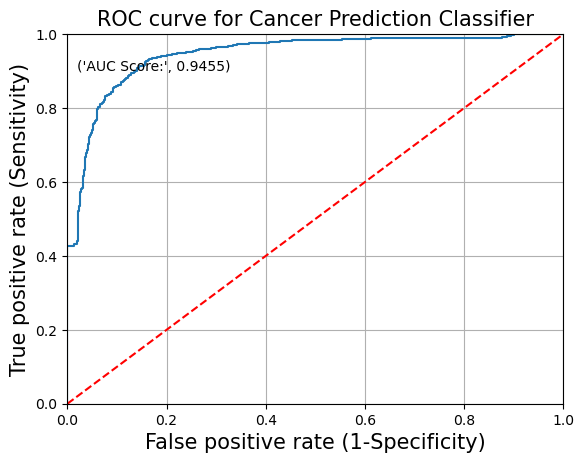

In [227]:
plot_roc(gnb_model, test_data=X_test)

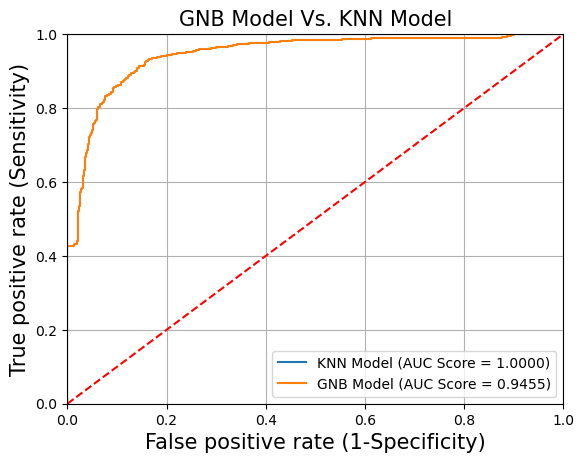

In [228]:
y_pred_prob_knn = knn_grid.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob_knn)
auc_score_knn = roc_auc_score(y_test, y_pred_prob_knn)
plt.plot(fpr, tpr, label='KNN Model (AUC Score = %0.4f)' % auc_score_knn)
y_pred_prob_gnb = gnb_model.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob_gnb)
auc_score_gnb = roc_auc_score(y_test, y_pred_prob_gnb)
plt.plot(fpr, tpr, label='GNB Model (AUC Score = %0.4f)' % auc_score_gnb)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.plot([0, 1], [0, 1],'r--')
plt.title('GNB Model Vs. KNN Model', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)
plt.legend(loc = 'lower right')
plt.grid(True)

### Decision Tree Classification

In [229]:
decision_tree_classification = DecisionTreeClassifier(criterion = 'entropy', random_state = 10)
decision_tree = decision_tree_classification.fit(X_train, y_train)

In [230]:
train_report = get_train_report(decision_tree, train_data=X_train)
print(train_report)

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2932
         1.0       1.00      1.00      1.00      2754

    accuracy                           1.00      5686
   macro avg       1.00      1.00      1.00      5686
weighted avg       1.00      1.00      1.00      5686



In [231]:
test_report = get_test_report(decision_tree, test_data=X_test)
print(test_report)

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1276
         1.0       1.00      1.00      1.00      1162

    accuracy                           1.00      2438
   macro avg       1.00      1.00      1.00      2438
weighted avg       1.00      1.00      1.00      2438



Interpretation: From the above output, we can see that there is a difference between the train and test accuracy; thus, we can conclude that the decision tree is over-fitted on the train data.

if we tune the hyperparameters in the decision tree, it helps to avoid the over-fitting of the tree.

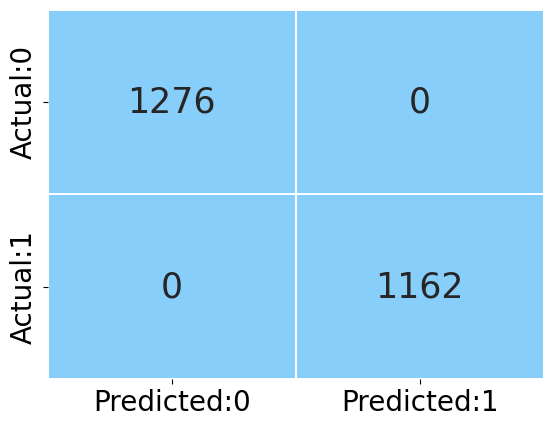

In [232]:
plot_confusion_matrix(decision_tree, test_data = X_test)

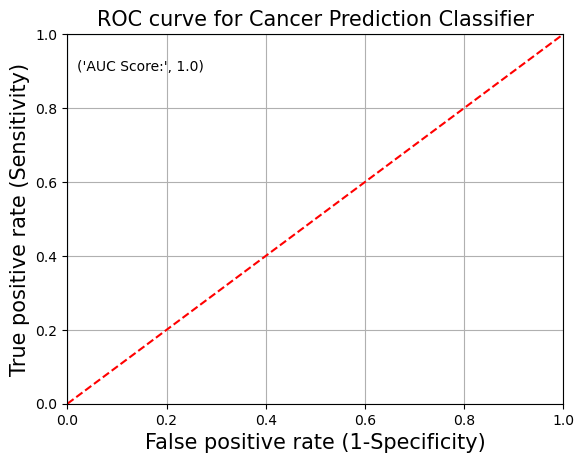

In [233]:
plot_roc(decision_tree, test_data=X_test)

In [234]:
dt_model = DecisionTreeClassifier(criterion = 'gini',
                                  max_depth = 5,
                                  min_samples_split = 4,
                                  max_leaf_nodes = 6,
                                  random_state = 10)
decision_tree = dt_model.fit(X_train, y_train)
train_report = get_train_report(decision_tree, train_data=X_train)
print('Train data:\n', train_report)
test_report = get_test_report(decision_tree, test_data=X_test)
print('Test data:\n', test_report)

Train data:
               precision    recall  f1-score   support

         0.0       0.96      0.94      0.95      2932
         1.0       0.94      0.96      0.95      2754

    accuracy                           0.95      5686
   macro avg       0.95      0.95      0.95      5686
weighted avg       0.95      0.95      0.95      5686

Test data:
               precision    recall  f1-score   support

         0.0       0.96      0.94      0.95      1276
         1.0       0.94      0.96      0.95      1162

    accuracy                           0.95      2438
   macro avg       0.95      0.95      0.95      2438
weighted avg       0.95      0.95      0.95      2438



Interpretation: From the above output, we can see that there is slight significant difference between the train and test accuracy; thus, we can conclude that the decision tree is less over-fiited after specifying some of the hyperparameters.

### Decision Tree Classification GridSearchCV

In [235]:
# tuned_paramaters = [{'criterion': ['entropy', 'gini'], 
#                      'max_depth': range(2, 10),
#                      'max_features': ["sqrt", "log2"],
#                      'min_samples_split': range(2,10),
#                      'min_samples_leaf': range(1,10),
#                      'max_leaf_nodes': range(1, 10)}]
# decision_tree_classification = DecisionTreeClassifier(random_state = 10)
# tree_grid = GridSearchCV(estimator = decision_tree_classification, 
#                          param_grid = tuned_paramaters, 
#                          cv = 5)
# tree_grid_model = tree_grid.fit(X_train, y_train)
# print('Best parameters for decision tree classifier: ', tree_grid_model.best_params_, '\n')

In [236]:
# dt_model = DecisionTreeClassifier(criterion = tree_grid_model.best_params_.get('criterion'),
#                                   max_depth = tree_grid_model.best_params_.get('max_depth'),
#                                   max_features = tree_grid_model.best_params_.get('max_features'),
#                                   max_leaf_nodes = tree_grid_model.best_params_.get('max_leaf_nodes'),
#                                   min_samples_leaf = tree_grid_model.best_params_.get('min_samples_leaf'),
#                                   min_samples_split = tree_grid_model.best_params_.get('min_samples_split'),
#                                   random_state = 10)

# # use fit() to fit the model on the train set
# dt_model = dt_model.fit(X_train, y_train)

In [237]:
# print('Classification Report for train set: \n', get_train_report(dt_model, train_data = X_train))

In [238]:
# print('Classification Report for test set: \n', get_test_report(dt_model, test_data = X_test))

**Interpretation:** From the above output, we can see that there is no significant difference between the train and test accuracy; thus, we can conclude that the decision tree after tuning the hyperparameters avoids the over-fitting of the data.

### Random Forest classification

In [239]:
rf_classification = RandomForestClassifier(n_estimators = 10, random_state = 10)
rf_model = rf_classification.fit(X_train, y_train)

In [240]:
train_report = get_train_report(rf_model,train_data = X_train)
print(train_report) 

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2932
         1.0       1.00      1.00      1.00      2754

    accuracy                           1.00      5686
   macro avg       1.00      1.00      1.00      5686
weighted avg       1.00      1.00      1.00      5686



In [241]:
test_report = get_test_report(rf_model, test_data = X_test)
print(test_report) 

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1276
         1.0       1.00      1.00      1.00      1162

    accuracy                           1.00      2438
   macro avg       1.00      1.00      1.00      2438
weighted avg       1.00      1.00      1.00      2438



### Random Forest Classification Grid Search CV

In [242]:
# tuned_paramaters_rf = [{'criterion': ['entropy', 'gini'],
#                      'n_estimators': [10, 30, 50, 70, 90],
#                      'max_depth': [10, 15, 20],
#                      'max_features': ['sqrt', 'log2'],
#                      'min_samples_split': [2, 5, 8, 11],
#                      'min_samples_leaf': [1, 5, 9],
#                      'max_leaf_nodes': [2, 5, 8, 11]}]
 
# # instantiate the 'RandomForestClassifier' 
# # pass the 'random_state' to obtain the same samples for each time you run the code
# random_forest_classification = RandomForestClassifier(random_state = 10)

# # use GridSearchCV() to find the optimal value of the hyperparameters
# # estimator: pass the random forest classifier model
# # param_grid: pass the list 'tuned_parameters'
# # cv: number of folds in k-fold i.e. here cv = 5
# rf_grid = GridSearchCV(estimator = random_forest_classification, 
#                        param_grid = tuned_paramaters_rf, 
#                        cv = 5)

# # use fit() to fit the model on the train set
# rf_grid_model = rf_grid.fit(X_train, y_train)

# # get the best parameters
# print('Best parameters for random forest classifier: ', rf_grid_model.best_params_, '\n')

In [243]:
# rf_model = RandomForestClassifier(criterion = rf_grid_model.best_params_.get('criterion'), 
#                                   n_estimators = rf_grid_model.best_params_.get('n_estimators'),
#                                   max_depth = rf_grid_model.best_params_.get('max_depth'),
#                                   max_features = rf_grid_model.best_params_.get('max_features'),
#                                   max_leaf_nodes = rf_grid_model.best_params_.get('max_leaf_nodes'),
#                                   min_samples_leaf = rf_grid_model.best_params_.get('min_samples_leaf'),
#                                   min_samples_split = rf_grid_model.best_params_.get('min_samples_split'),
#                                   random_state = 10)
# rf_model = rf_model.fit(X_train, y_train)
# print('Classification Report for test set:\n', get_test_report(rf_model,test_data = X_test))

In [244]:
# print('Classification Report for Train set:\n', get_train_report(rf_model,train_data = X_train))

In [245]:
# plot_roc(rf_model,test_data=X_test)

In [246]:
# plot_confusion_matrix(rf_model, test_data=X_test)

Interpretation: The accuracy of the test dataset increased from 0.81 to 0.82 after tuning of the hyperparameters. Also, the sensitivity and specificity of the model are balanced.

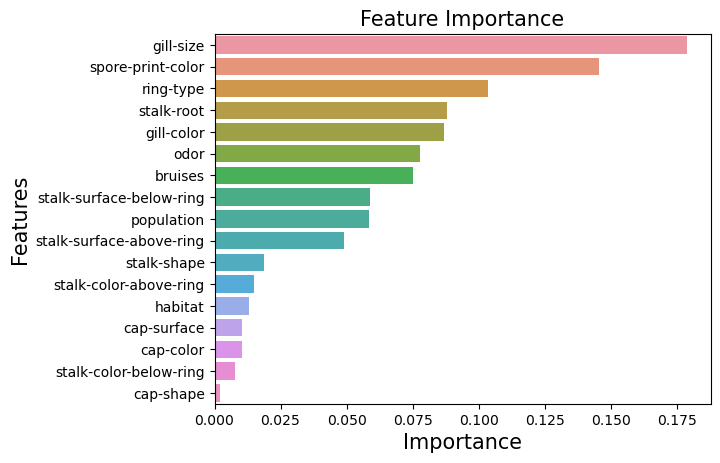

In [247]:
important_features = pd.DataFrame({'Features': X_train.columns, 
                                   'Importance': rf_model.feature_importances_})
important_features = important_features.sort_values('Importance', ascending = False)
sns.barplot(x = 'Importance', y = 'Features', data = important_features)
plt.title('Feature Importance', fontsize = 15)
plt.xlabel('Importance', fontsize = 15)
plt.ylabel('Features', fontsize = 15)
plt.show()

### Ada Boost 

In [248]:
ada_model = AdaBoostClassifier(n_estimators = 40, random_state = 10)
ada_model.fit(X_train, y_train)

AdaBoostClassifier(n_estimators=40, random_state=10)

In [249]:
test_report = get_train_report(ada_model,train_data = X_train)
print(test_report)

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2932
         1.0       1.00      1.00      1.00      2754

    accuracy                           1.00      5686
   macro avg       1.00      1.00      1.00      5686
weighted avg       1.00      1.00      1.00      5686



In [250]:
test_report = get_test_report(ada_model,test_data = X_test)
print(test_report)

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1276
         1.0       1.00      1.00      1.00      1162

    accuracy                           1.00      2438
   macro avg       1.00      1.00      1.00      2438
weighted avg       1.00      1.00      1.00      2438



Interpretation: The output shows that the model is 83% accurate.

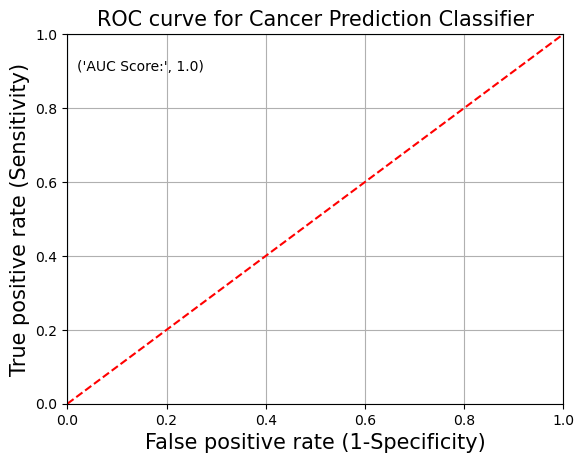

In [251]:
plot_roc(ada_model,test_data=X_test)

### Gradient Boosting Classification

In [252]:
gboost_model = GradientBoostingClassifier(n_estimators = 150, max_depth = 10, random_state = 10)
gboost_model.fit(X_train, y_train)

GradientBoostingClassifier(max_depth=10, n_estimators=150, random_state=10)

In [253]:
test_report = get_train_report(gboost_model,train_data = X_train)
print(test_report)

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2932
         1.0       1.00      1.00      1.00      2754

    accuracy                           1.00      5686
   macro avg       1.00      1.00      1.00      5686
weighted avg       1.00      1.00      1.00      5686



In [254]:
test_report = get_test_report(gboost_model,test_data = X_test)
print(test_report)

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1276
         1.0       1.00      1.00      1.00      1162

    accuracy                           1.00      2438
   macro avg       1.00      1.00      1.00      2438
weighted avg       1.00      1.00      1.00      2438



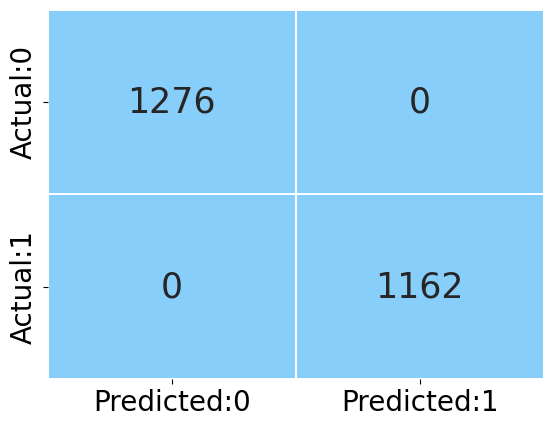

In [255]:
plot_confusion_matrix(gboost_model, test_data=X_test)

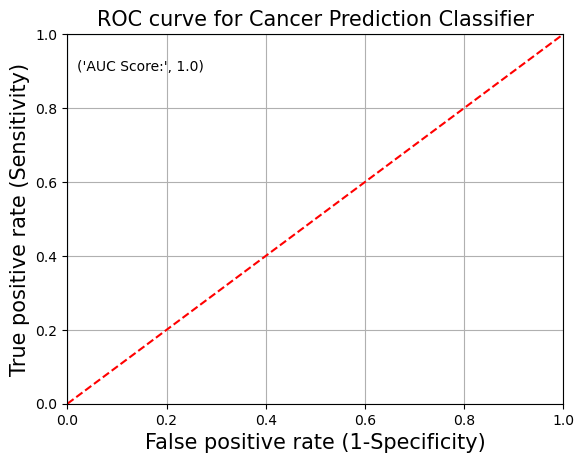

In [256]:
plot_roc(gboost_model,test_data = X_test)

### XGB Classification

In [257]:
xgb_model = XGBClassifier(max_depth = 10, gamma = 1)
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [258]:
test_report = get_train_report(xgb_model,train_data = X_train)
print(test_report)

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2932
         1.0       1.00      1.00      1.00      2754

    accuracy                           1.00      5686
   macro avg       1.00      1.00      1.00      5686
weighted avg       1.00      1.00      1.00      5686



In [259]:
test_report = get_test_report(xgb_model,test_data = X_test)
print(test_report)

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1276
         1.0       1.00      1.00      1.00      1162

    accuracy                           1.00      2438
   macro avg       1.00      1.00      1.00      2438
weighted avg       1.00      1.00      1.00      2438



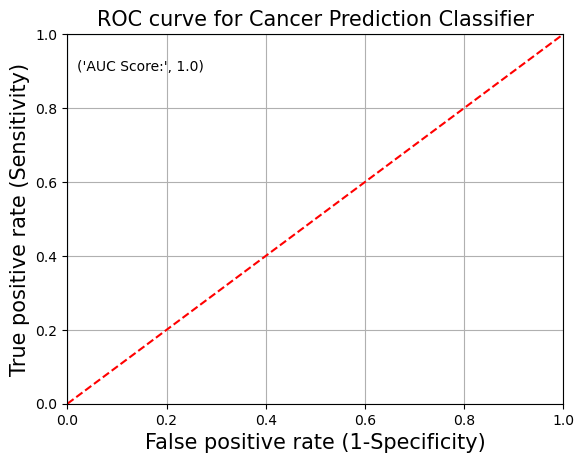

In [260]:
plot_roc(xgb_model,test_data = X_test)

### XGB Classification Grid Search CV

In [261]:
tuning_parameters = {'learning_rate': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6],
                     'max_depth': range(3,10),
                     'gamma': [0, 1, 2, 3, 4]}
xgb_model = XGBClassifier()
xgb_grid = GridSearchCV(estimator = xgb_model, param_grid = tuning_parameters, cv = 3, scoring = 'roc_auc')
xgb_grid.fit(X_train, y_train)
print('Best parameters for XGBoost classifier: ', xgb_grid.best_params_, '\n')

Best parameters for XGBoost classifier:  {'gamma': 0, 'learning_rate': 0.1, 'max_depth': 3} 



In [262]:
xgb_grid_model = XGBClassifier(learning_rate = xgb_grid.best_params_.get('learning_rate'),
                               max_depth = xgb_grid.best_params_.get('max_depth'),
                              gamma = xgb_grid.best_params_.get('gamma'))
xgb_model = xgb_grid_model.fit(X_train, y_train)
print('Classification Report for test set:\n', get_test_report(xgb_model,test_data = X_test))

Classification Report for test set:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1276
         1.0       1.00      1.00      1.00      1162

    accuracy                           1.00      2438
   macro avg       1.00      1.00      1.00      2438
weighted avg       1.00      1.00      1.00      2438



In [263]:
print('Classification Report for Train set:\n', get_train_report(xgb_model,train_data = X_train))

Classification Report for Train set:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2932
         1.0       1.00      1.00      1.00      2754

    accuracy                           1.00      5686
   macro avg       1.00      1.00      1.00      5686
weighted avg       1.00      1.00      1.00      5686



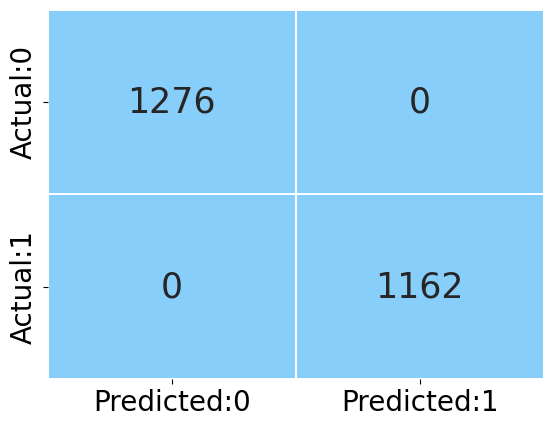

In [264]:
plot_confusion_matrix(xgb_grid_model, test_data=X_test)

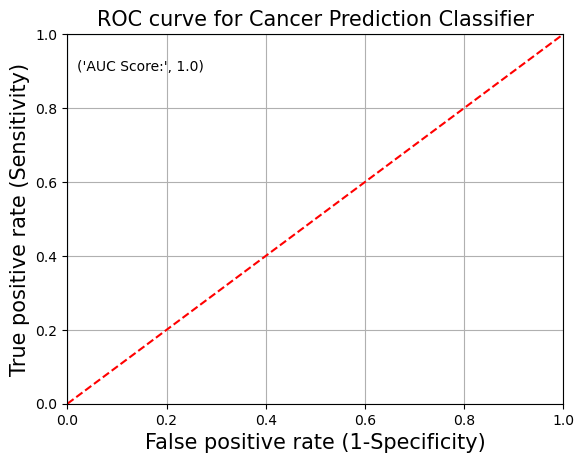

In [265]:
plot_roc(xgb_model,test_data = X_test)

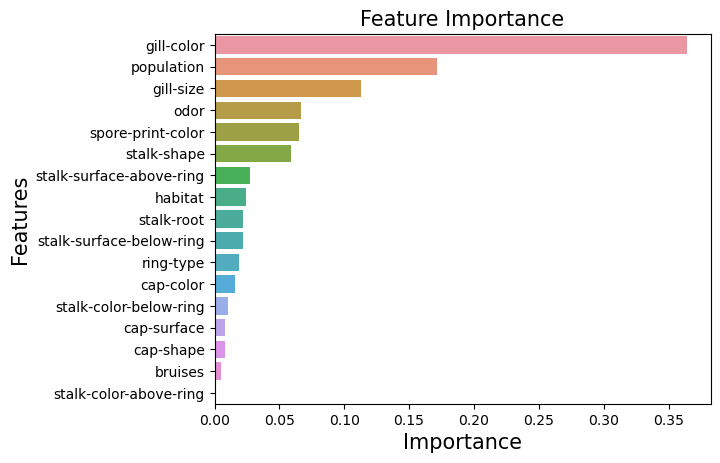

In [266]:
important_features = pd.DataFrame({'Features': X_train.columns, 
                                   'Importance': xgb_model.feature_importances_})
important_features = important_features.sort_values('Importance', ascending = False)
sns.barplot(x = 'Importance', y = 'Features', data = important_features)
plt.title('Feature Importance', fontsize = 15)
plt.xlabel('Importance', fontsize = 15)
plt.ylabel('Features', fontsize = 15)
plt.show()

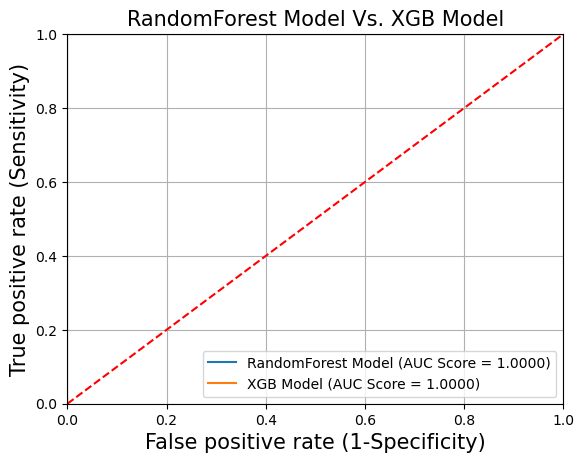

In [267]:
y_pred_prob_rf = rf_model.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob_rf)
auc_score_rf = roc_auc_score(y_test, y_pred_prob_rf)
plt.plot(fpr, tpr, label='RandomForest Model (AUC Score = %0.4f)' % auc_score_rf)
y_pred_prob_xgb = xgb_grid_model.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob_xgb)
auc_score_xgb = roc_auc_score(y_test, y_pred_prob_xgb)
plt.plot(fpr, tpr, label='XGB Model (AUC Score = %0.4f)' % auc_score_xgb)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.plot([0, 1], [0, 1],'r--')
plt.title('RandomForest Model Vs. XGB Model', fontsize = 15)
plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)
plt.legend(loc = 'lower right')
plt.grid(True)

### Stacking Classification 

In [268]:
# consider the various algorithms as base learners
base_learners = [('rf_model', RandomForestClassifier(criterion = 'entropy', max_depth = 10, max_features = 'sqrt', 
                                                     max_leaf_nodes = 8, min_samples_leaf = 5, min_samples_split = 2, 
                                                     n_estimators = 50, random_state = 10)),
                 ('KNN_model', KNeighborsClassifier(n_neighbors = 17, metric = 'euclidean')),
                 ('NB_model', GaussianNB())]

# initialize stacking classifier 
# pass the base learners to the parameter, 'estimators'
# pass the Naive Bayes model as the 'final_estimator'/ meta model
stack_model = StackingClassifier(estimators = base_learners, final_estimator = GaussianNB())

# fit the model on train dataset
stack_model.fit(X_train, y_train)

StackingClassifier(estimators=[('rf_model',
                                RandomForestClassifier(criterion='entropy',
                                                       max_depth=10,
                                                       max_features='sqrt',
                                                       max_leaf_nodes=8,
                                                       min_samples_leaf=5,
                                                       n_estimators=50,
                                                       random_state=10)),
                               ('KNN_model',
                                KNeighborsClassifier(metric='euclidean',
                                                     n_neighbors=17)),
                               ('NB_model', GaussianNB())],
                   final_estimator=GaussianNB())

In [269]:
test_report = get_train_report(stack_model,train_data = X_train)
print(test_report)

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2932
         1.0       1.00      1.00      1.00      2754

    accuracy                           1.00      5686
   macro avg       1.00      1.00      1.00      5686
weighted avg       1.00      1.00      1.00      5686



In [270]:
test_report = get_test_report(stack_model,test_data = X_test)
print(test_report)

              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      1276
         1.0       0.99      1.00      1.00      1162

    accuracy                           1.00      2438
   macro avg       1.00      1.00      1.00      2438
weighted avg       1.00      1.00      1.00      2438



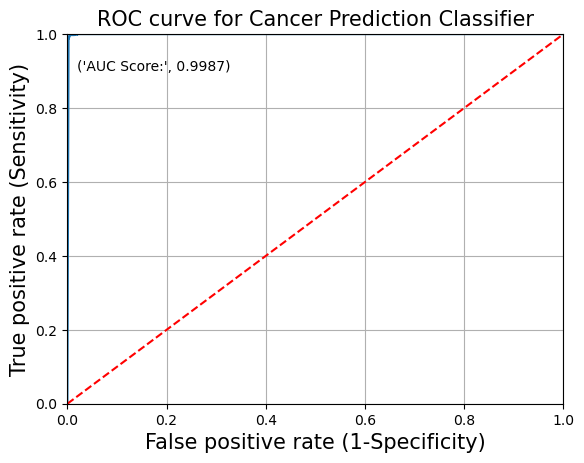

In [271]:
plot_roc(stack_model,test_data = X_test)